# EE551 Mini-Project: Parking Spot Detector and Classifier

Name: Tanush Rajkumar <br> 
ID: 25230857 <br>
Class Code: EE551

## Import

In [1]:
from scipy.ndimage import gaussian_filter1d
import matplotlib.pyplot as plt
import numpy as np
import cv2

## Preprocess

In [2]:
def img_preprocess(src):
    # grayscale conversion
    mono = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)

    # noise reduction
    smooth = cv2.GaussianBlur(mono, (5, 5), 0)

    # contrast boost
    eq = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    boosted = eq.apply(smooth)

    return mono, smooth, boosted


def extract_edges(frame):
    # sobel gradients
    gx = cv2.Sobel(frame, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(frame, cv2.CV_64F, 0, 1, ksize=3)

    mag = np.sqrt(gx * gx + gy * gy)
    mag = np.uint8(mag * 255 / mag.max())

    # canny edges
    canny_out = cv2.Canny(frame, 30, 100)

    return mag, canny_out

## Grid Formation

In [3]:
def find_grid_lines(edge_map):
    # horizontal extraction
    h_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40, 1))
    h_mask = cv2.morphologyEx(edge_map, cv2.MORPH_OPEN, h_kernel)

    # vertical extraction
    v_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 40))
    v_mask = cv2.morphologyEx(edge_map, cv2.MORPH_OPEN, v_kernel)

    # probabilistic hough
    h_segments = cv2.HoughLinesP(
        h_mask, 1, np.pi / 180, threshold=50,
        minLineLength=30, maxLineGap=20
    )

    v_segments = cv2.HoughLinesP(
        v_mask, 1, np.pi / 180, threshold=50,
        minLineLength=30, maxLineGap=20
    )

    return h_mask, v_mask, h_segments, v_segments


def locate_row_markers(h_lines):
    # project along width
    proj = np.sum(h_lines, axis=1)

    # smooth signal
    filt = gaussian_filter1d(proj, sigma=5)

    # peak selection
    limit = np.max(filt) * 0.3
    idx = []

    for j in range(1, len(filt) - 1):
        if filt[j] > limit and filt[j] > filt[j - 1] and filt[j] > filt[j + 1]:
            idx.append(j)

    # merge close peaks
    rows = []
    if idx:
        buf = [idx[0]]
        for val in idx[1:]:
            if val - buf[-1] < 30:
                buf.append(val)
            else:
                rows.append(int(np.mean(buf)))
                buf = [val]
        rows.append(int(np.mean(buf)))

    return rows, proj


def locate_column_markers(v_lines):
    # project along height
    proj = np.sum(v_lines, axis=0)

    # smooth curve
    filt = gaussian_filter1d(proj, sigma=3)

    # detect peaks
    cutoff = np.max(filt) * 0.2
    candidates = []

    for k in range(1, len(filt) - 1):
        if filt[k] > cutoff and filt[k] > filt[k - 1] and filt[k] > filt[k + 1]:
            candidates.append(k)

    # remove close duplicates
    cols = []
    if candidates:
        cols.append(candidates[0])
        for c in candidates[1:]:
            if c - cols[-1] > 20:
                cols.append(c)

    return cols, proj

## Build Slots in Grid

In [4]:
def build_slot_grid(rows, cols, shape):
    slots = []

    h, w = shape[:2]

    # no row info
    if not rows:
        if not cols:
            parts = 8
            cols = [i * w // parts for i in range(1, parts)]

        col_edges = sorted([0] + cols + [w])

        for x in range(len(col_edges) - 1):
            x0 = col_edges[x]
            x1 = col_edges[x + 1]
            span = x1 - x0

            if span > 30 and span < w * 0.25:
                slots.append((x0 + 5, 5, span - 10, h - 10))

        return slots

    # rows exist
    row_edges = sorted([0] + rows + [h])

    if not cols:
        parts = 8
        col_edges = [i * w // parts for i in range(parts + 1)]
    else:
        col_edges = sorted([0] + cols + [w])

    heights = []
    for r in range(len(row_edges) - 1):
        heights.append(row_edges[r + 1] - row_edges[r])

    if heights:
        mid = sorted(heights)[len(heights) // 2]
        h_min = mid * 0.6
        h_max = mid * 1.4
    else:
        h_min = 40
        h_max = h * 0.4

    for r in range(len(row_edges) - 1):
        y0 = row_edges[r]
        y1 = row_edges[r + 1]
        rh = y1 - y0

        if rh < h_min or rh > h_max:
            continue

        for c in range(len(col_edges) - 1):
            x0 = col_edges[c]
            x1 = col_edges[c + 1]
            cw = x1 - x0

            if cw > 30 and cw < w * 0.25:
                slots.append((x0 + 5, y0 + 5, cw - 10, rh - 10))

    return slots


def detect_parking_spaces(frame, enhanced_img, edge_map):
    # morphology prep
    k = np.ones((3, 3), np.uint8)

    # adaptive binarization
    bw = cv2.adaptiveThreshold(
        enhanced_img, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        11, 2
    )

    er = cv2.erode(bw, k, iterations=1)
    dil = cv2.dilate(er, k, iterations=2)

    # line extraction
    h_mask, v_mask, _, _ = find_grid_lines(edge_map)

    # row / column detection
    rows, _ = locate_row_markers(h_mask)
    cols, _ = locate_column_markers(v_mask)

    # grid creation
    slots = build_slot_grid(rows, cols, frame.shape)

    return bw, dil, h_mask, v_mask, slots, rows, cols


def classify_slots(frame, enhanced_img, slots):
    classified = []

    for idx, (x, y, w, h) in enumerate(slots):
        x0 = max(0, x)
        y0 = max(0, y)
        w0 = min(w, frame.shape[1] - x0)
        h0 = min(h, frame.shape[0] - y0)

        roi = enhanced_img[y0:y0+h0, x0:x0+w0]
        if roi.size == 0 or w0 <= 0 or h0 <= 0:
            continue

        # basic intensity stats
        mean_val = np.mean(roi)
        std_val = np.std(roi)

        # edge info
        edges = cv2.Canny(roi, 50, 150)
        edge_count = np.sum(edges > 0)
        edge_density = edge_count / (w0 * h0) if (w0 * h0) > 0 else 0

        # shadow & bright areas
        dark_ratio = np.sum(roi < 80) / (w0 * h0) if (w0 * h0) > 0 else 0
        bright_ratio = np.sum(roi > 160) / (w0 * h0) if (w0 * h0) > 0 else 0

        # texture variance
        ksize = 5
        if roi.shape[0] >= ksize and roi.shape[1] >= ksize:
            roi_f = roi.astype(np.float32)
            local_mean = cv2.blur(roi_f, (ksize, ksize))
            local_mean_sq = cv2.blur(roi_f**2, (ksize, ksize))
            local_var = local_mean_sq - local_mean**2
            texture_var = np.mean(local_var)
        else:
            texture_var = 0

        # scoring for occupancy
        score = 0
        if edge_density > 0.18:
            score += 2
        elif edge_density > 0.12:
            score += 1

        if std_val > 20:
            score += 1
        if dark_ratio > 0.15:
            score += 1
        if texture_var > 150:
            score += 1

        # empty indicators
        if mean_val > 120 and std_val < 15:
            score -= 2
        if edge_density < 0.08 and std_val < 12:
            score -= 2

        occupied = score >= 2

        classified.append({
            'id': idx + 1,
            'position': (x0, y0, w0, h0),
            'occupied': occupied,
            'mean_intensity': mean_val,
            'edge_density': edge_density,
            'std_intensity': std_val,
            'very_dark_ratio': dark_ratio,
            'texture_variance': texture_var,
            'occupied_score': score
        })

    return classified

def process_slot_region(roi_img):
    # preprocessing
    mono, smooth, enhanced = img_preprocess(roi_img)

    # edge extraction
    grad, edges = extract_edges(enhanced)

    # parking detection
    bw, dil, h_mask, v_mask, slots, rows, cols = detect_parking_spaces(
        roi_img, enhanced, edges
    )

    # classification
    classified = classify_slots(roi_img, enhanced, slots)

    return classified, enhanced, edges, h_mask, v_mask, dil

## Region of Interest (ROI) Transform

In [5]:
def img_crop(img, all_rois, crop_type=1):
    new_imgs = []
    for i, roi in enumerate(all_rois):

        if crop_type == 1:
            xs = [p[0] for p in roi]
            ys = [p[1] for p in roi]

            x_min, x_max = min(xs), max(xs)
            y_min, y_max = min(ys), max(ys)

            img_n = img[y_min:y_max, x_min:x_max]
            new_imgs.append(img_n)
        elif crop_type == 2:
        
            h, w = img.shape[:2]
            src_pts = np.float32([
                [0, 0],  
                [w-1, 0],    
                [0, h-1],      
                [w-1, h-1],    
            ])


            dst_pts = roi

            # Compute perspective transform matrix (handles shear)
            M = cv2.getPerspectiveTransform(dst_pts, src_pts)

            # Output canvas size (large enough to contain warped result)
            out_w = int(max(dst_pts[:,0]))
            out_h = int(max(dst_pts[:,1]))

            new_imgs.append(cv2.warpPerspective(img, M, (out_w, out_h)))

        elif crop_type == 3:
            src_pts = roi

            # Compute width of the new image
            width_top = np.linalg.norm(src_pts[1] - src_pts[0])
            width_bottom = np.linalg.norm(src_pts[2] - src_pts[3])
            max_width = int(max(width_top, width_bottom))

            # Compute height of the new image
            height_left = np.linalg.norm(src_pts[3] - src_pts[0])
            height_right = np.linalg.norm(src_pts[2] - src_pts[1])
            max_height = int(max(height_left, height_right))

            # Destination points (straightened rectangle)
            dst_pts = np.array([
                [0, 0],
                [max_width - 1, 0],
                [max_width - 1, max_height - 1],
                [0, max_height - 1]
            ], dtype=np.float32)

            # Perspective transform
            M = cv2.getPerspectiveTransform(src_pts, dst_pts)

            new_imgs.append(cv2.warpPerspective(img, M, (max_width, max_height)))
            
    return new_imgs
   

roi_list = [
    {
        "filename" : "sets/easy/20.png",
        "roi" : [
            [(3, 122),(1196, 126),(1191, 512),(19, 507)]
        ]
    }, 
    {
        "filename" : "sets/easy/29.png",
        "roi" : [
            [(60, 1),(471, 1),(474, 83),(61, 82)],
            [(61, 143), (475, 140), (474, 306), (61, 305)]
        ]
    }, 
    {
        "filename" : "sets/easy/easy.jpg",
        "roi" : [
            [(0, 15),(225, 15),(224, 268),(0, 269)],
            [(360, 11), (609, 10), (610, 258), (363, 262)]
        ]
    },
    {
        "filename" : "sets/easy/not_that_easy.jpg",
        "roi" : [
            [(105, 57),(599, 61),(599, 358),(107, 361)],
        ]
    },

    {
        "filename" : "sets/medium/12.png",
        "roi" : [
            [(207, 147),(1712, 144),(1710, 595),(205, 595)],
            [(199, 891),(1710, 897),(1710, 897),(213, 1078)]
        ]
    },
    {
        "filename" : "sets/medium/31.png",
        "roi" : [
            [(1, 26),(1407, 25),(1412, 254),(1412, 254)],
            [(1, 585),(1412, 556),(1407, 801),(9, 815)]
        ]
    },
    {
        "filename" : "sets/medium/30.png",
        "roi" : [
            np.float32([ 
                [10, 13],  [837, 40], [14, 191],  [889, 196], 
        ])
        ],
        "crop_type": 2
    },
    {
        "filename" : "sets/hard/21.png",
        "roi" : [
            np.array([
            [105, 176],
            [1075, 478],
            [1021, 729],
            [4, 409]
        ], dtype=np.float32)
        ],
        "crop_type": 3
    },
    {
        "filename" : "sets/hard/frame600.jpg",
        "roi" : [
            np.array([
                (138, 312), (1927, 393), (1905, 842), (114, 757),  
            ], dtype=np.float32),
            np.array([
                (2843, 416), (3775, 455), (3758, 924), (2827, 878)
            ], dtype=np.float32),
            np.array([
               (233, 1337), (1815, 1419), (1783, 1849), (218, 1763),  
            ], dtype=np.float32),
        ],
        "crop_type": 3
    },
     {
        "filename" : "sets/hard/frame1.jpg",
        "roi" : [
            np.array([
                [422, 391],[2763, 426],[2758, 778],[418, 740]
            ], dtype=np.float32),
            np.array([
                (74, 968), (2757, 1012), (2751, 1361), (70, 1317),
            ], dtype=np.float32),
            np.array([
                (3129, 433),  (3776, 439),(3771, 790), (3126, 782) ,
            ], dtype=np.float32),
            np.array([
                (3127, 1019), (3762, 1029), (3761, 1385), (3115, 1372),
            ], dtype=np.float32),
            np.array([
                (48, 1552), (584, 1561), (576, 1912), (45, 1898)
            ], dtype=np.float32),
            np.array([
                (580, 1562), (2719, 1597),(2714, 1768), (578, 1730), 
            ], dtype=np.float32),
        ],
        "crop_type": 3,
    },
]

## Final Pipeline

In [24]:
def main_pipeline(img_info):
    img_path = img_info["filename"]
    rois = img_info["roi"]

    # read image
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # crop ROIs
    if "crop_type" in img_info:
        cropped_imgs = img_crop(img_rgb, rois, crop_type=img_info["crop_type"])
    else:
        cropped_imgs = img_crop(img_rgb, rois)

    for i, roi in enumerate(cropped_imgs):
        all_results = []
        roi_records = []

        # process each ROI
        results, enhanced, edges, h_mask, v_mask, dilated = process_slot_region(roi)

        all_results.extend(results)
        roi_records.append({
            'roi_img': roi,
            'enhanced': enhanced,
            'edges': edges,
            'h_lines': h_mask,
            'v_lines': v_mask,
            'dilated': dilated,
            'results': results
        })

        # visualization
        vis = roi.copy()
        pad = 3

        for res in results:
            x, y, w, h = res['position']

            # outer yellow rectangle
            ox1, oy1 = max(0, x - pad), max(0, y - pad)
            ox2, oy2 = x + w + pad, y + h + pad
            cv2.rectangle(vis, (ox1, oy1), (ox2, oy2), (255, 255, 0), 1)

            # outer corners
            for cx, cy in [(ox1, oy1), (ox2, oy1), (ox2, oy2), (ox1, oy2)]:
                cv2.circle(vis, (cx, cy), 3, (0, 0, 255), -1)

            # inner red box if occupied
            if res['occupied']:
                ix1, iy1 = x + pad, y + pad
                ix2, iy2 = x + w - pad, y + h - pad
                cv2.rectangle(vis, (ix1, iy1), (ix2, iy2), (255, 0, 0), 1)

                for cx, cy in [(ix1, iy1), (ix2, iy1), (ix2, iy2), (ix1, iy2)]:
                    cv2.circle(vis, (cx, cy), 3, (0, 0, 255), -1)

        # display visualization
        plt.figure(figsize=(16, 12))
        plt.imshow(vis)
        
        _, difficulty, img_name = img_path.split("/")
        plt.imsave(fname=f"output/{i+1}_{img_name}", arr=vis)
        plt.title(f"Difficulty: {difficulty} File: {img_name}")
        plt.axis('off')
        plt.tight_layout()
        plt.show()


## Output

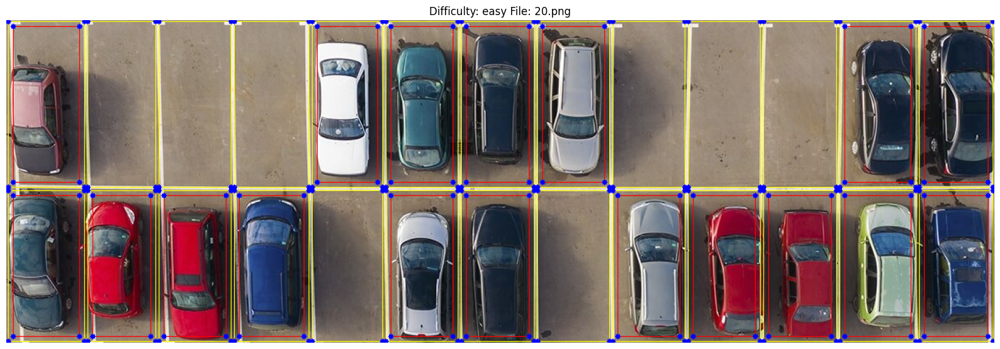

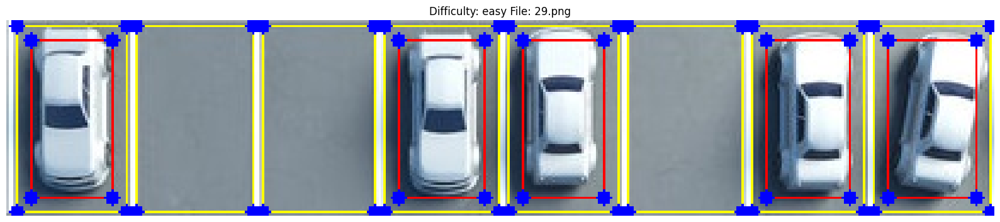

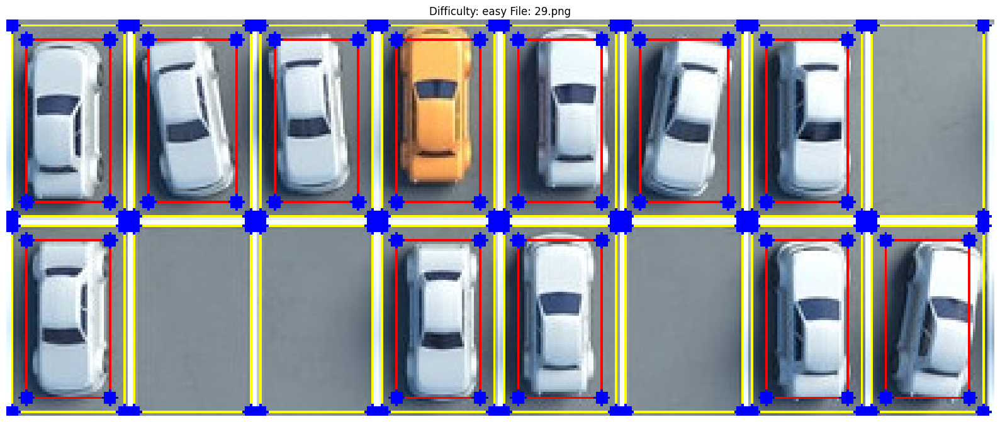

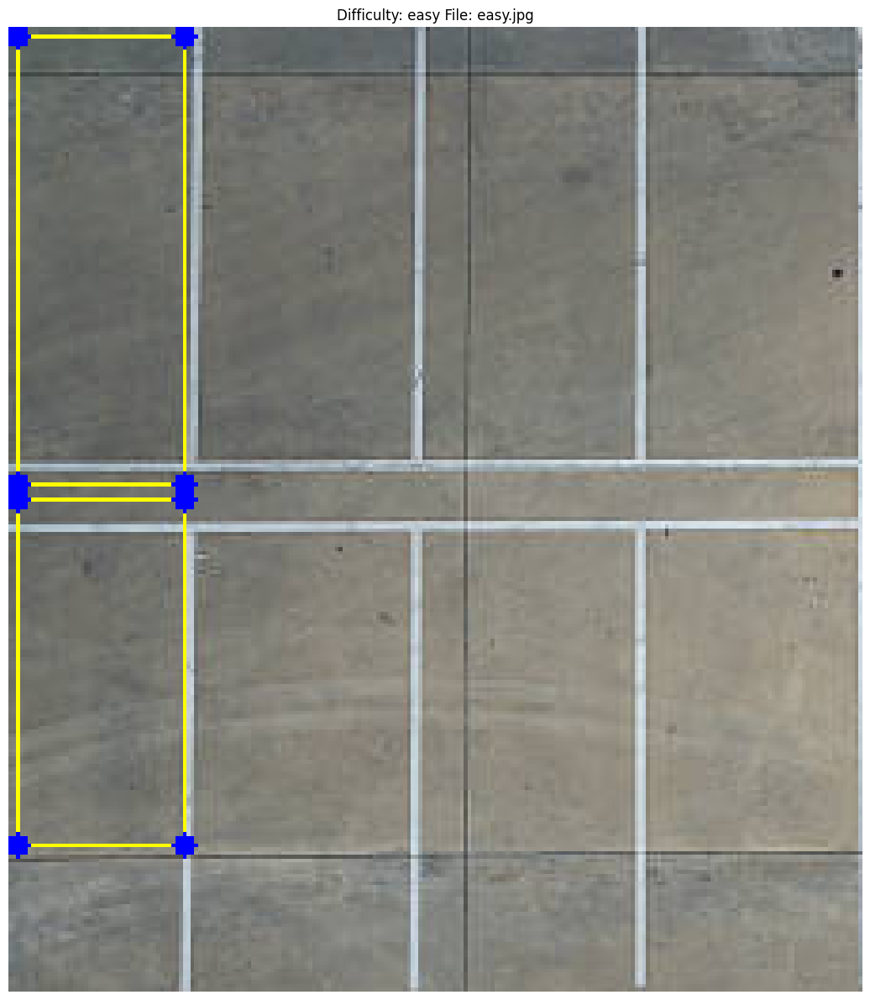

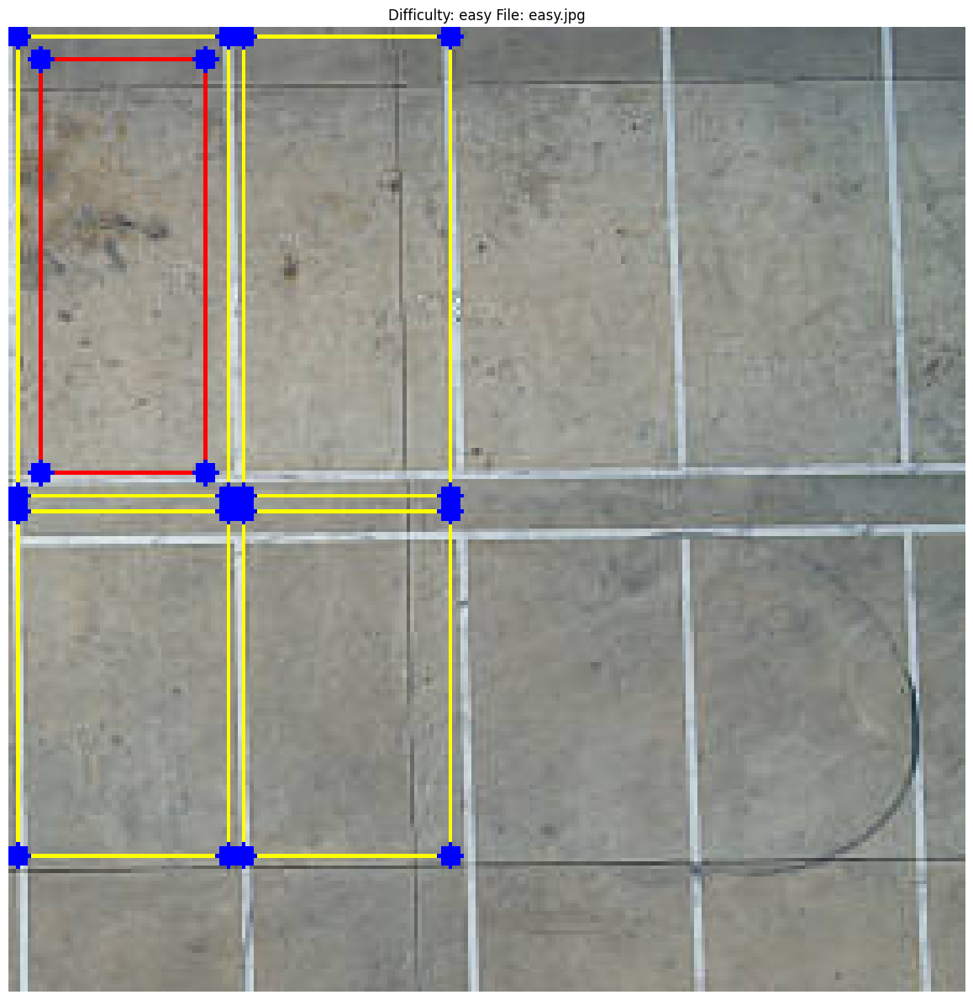

...

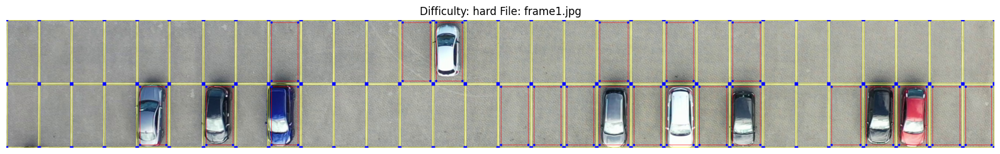

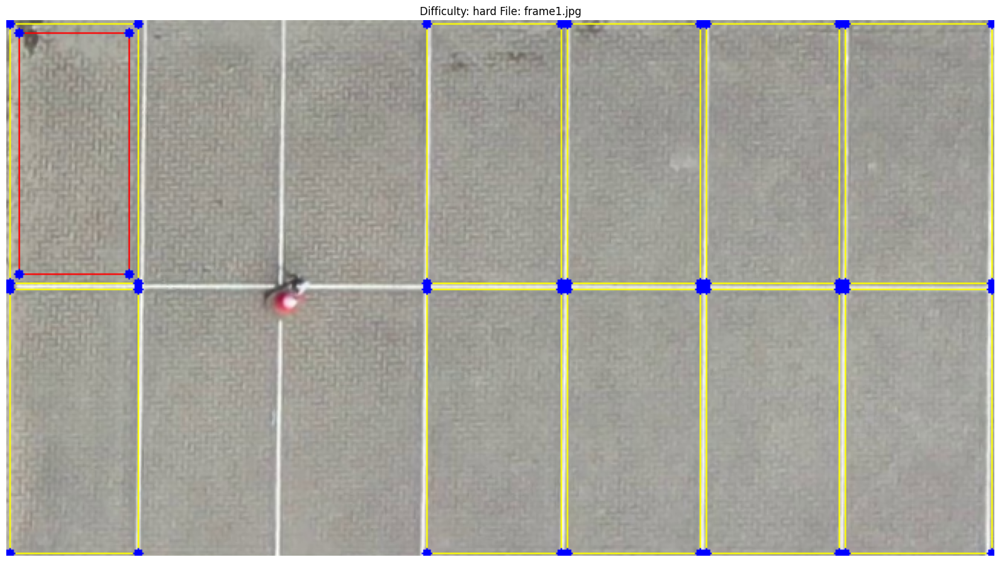

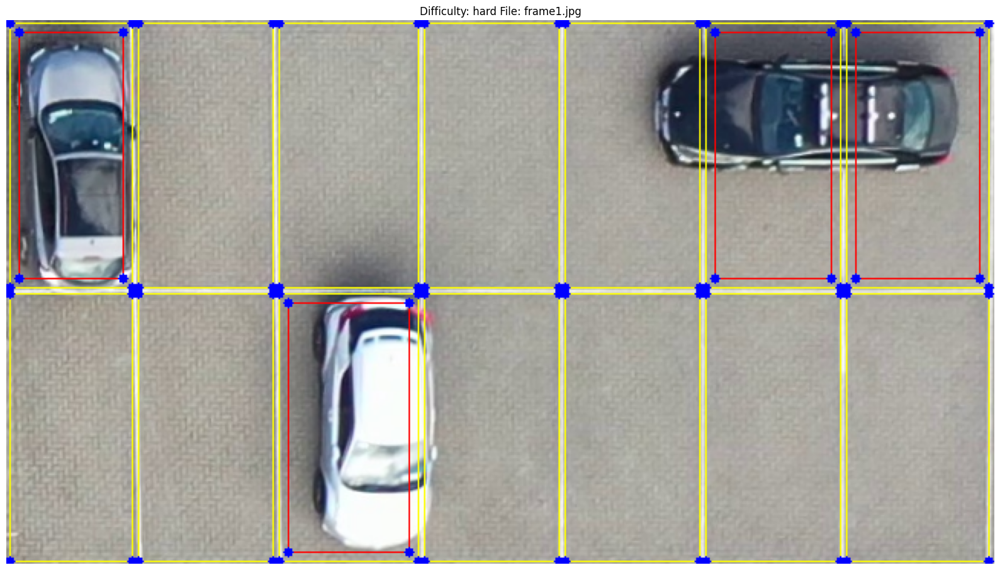

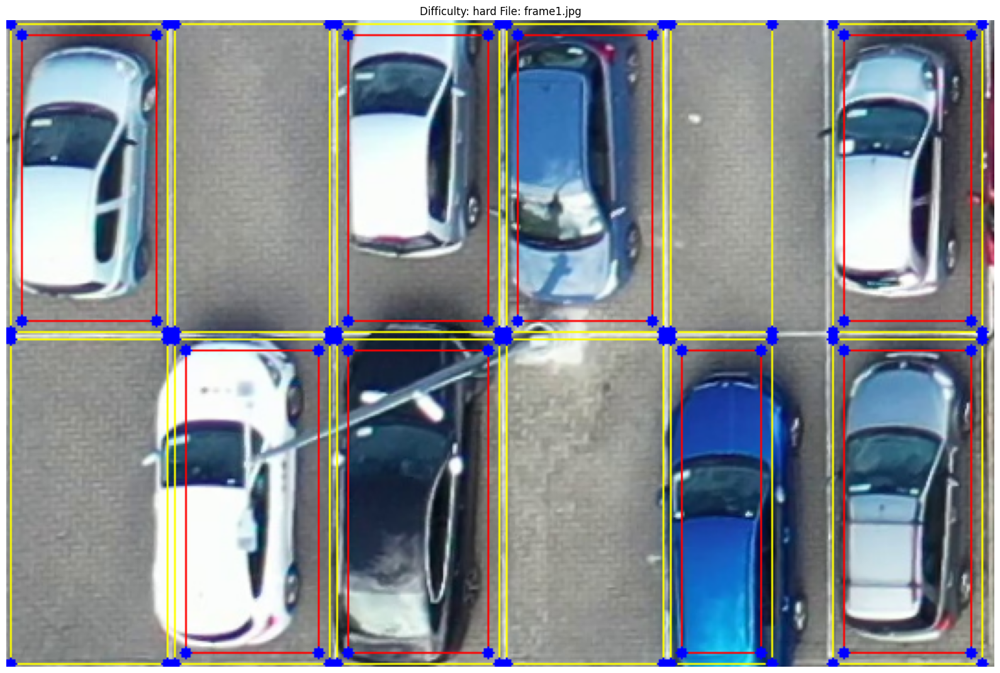

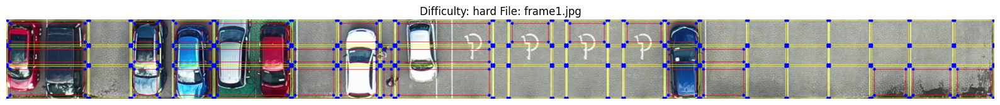

In [25]:
for each_img in roi_list:
    main_pipeline(each_img)